In [1]:
# Import necessary libraries
import music_dataset_utils as mdu
import matplotlib.pyplot as plt
import numpy as np
import os
from IPython.display import display, Audio

# Enable inline plotting
%matplotlib inline

In [2]:
# Set the path to the dataset
dataset_path = "data/smd"

# Initialize the dataset manager
smd = mdu.SaarlandMusicDataset(dataset_path)

# Print a summary of the dataset
smd.summary()

Found 50 recordings in the dataset
Saarland Music Dataset Summary:
Total recordings: 50
Recordings with 22kHz audio: 50 (100.0%)
Recordings with 44kHz audio: 50 (100.0%)
Recordings with MIDI: 50 (100.0%)
Recordings with CSV annotations: 50 (100.0%)
Recordings with WAV-MIDI: 50 (100.0%)
Recordings with all data types: 50 (100.0%)


In [3]:
# Find all Bach recordings in the dataset
bach_recordings = []

for recording_id in smd.recordings:
    if 'bach' in recording_id.lower():
        bach_recordings.append(recording_id)

# Print the Bach recordings found
print(f"Found {len(bach_recordings)} Bach recordings:")
for i, rec_id in enumerate(bach_recordings):
    print(f"{i+1}. {rec_id}")

Found 9 Bach recordings:
1. Bach_BWV871-02_002_20090916-SMD
2. Bach_BWV875-02_002_20090916-SMD
3. Bach_BWV849-02_001_20090916-SMD
4. Bach_BWV888-01_008_20110315-SMD
5. Bach_BWV888-02_008_20110315-SMD
6. Bach_BWV849-01_001_20090916-SMD
7. Bach_BWV875-01_002_20090916-SMD
8. Liszt_VariationenBachmotivWeinenKlagenSorgenZagen_001_20090916-SMD
9. Bach_BWV871-01_002_20090916-SMD


In [4]:
# Select the first Bach recording
if bach_recordings:
    # Get the recording
    bach_id = bach_recordings[0]
    recording = smd.get_recording(bach_id)
    
    # Load all available data
    recording.load_all()
    
    print(f"Loaded recording: {recording.recording_id}")
    print("\nAvailable data:")
    print(f"  Audio 22kHz: {'Yes' if recording.audio_22 is not None else 'No'}")
    print(f"  Audio 44kHz: {'Yes' if recording.audio_44 is not None else 'No'}")
    print(f"  MIDI: {'Yes' if recording.midi_data is not None else 'No'}")
    print(f"  CSV: {'Yes' if recording.csv_data is not None else 'No'}")
    print(f"  WAV-MIDI: {'Yes' if recording.wav_midi is not None else 'No'}")
    
    if recording.duration:
        print(f"\nRecording duration: {recording.duration:.2f} seconds")
else:
    print("No Bach recordings found.")

Loaded recording: Bach_BWV871-02_002_20090916-SMD

Available data:
  Audio 22kHz: Yes
  Audio 44kHz: Yes
  MIDI: Yes
  CSV: Yes
  WAV-MIDI: Yes

Recording duration: 127.00 seconds


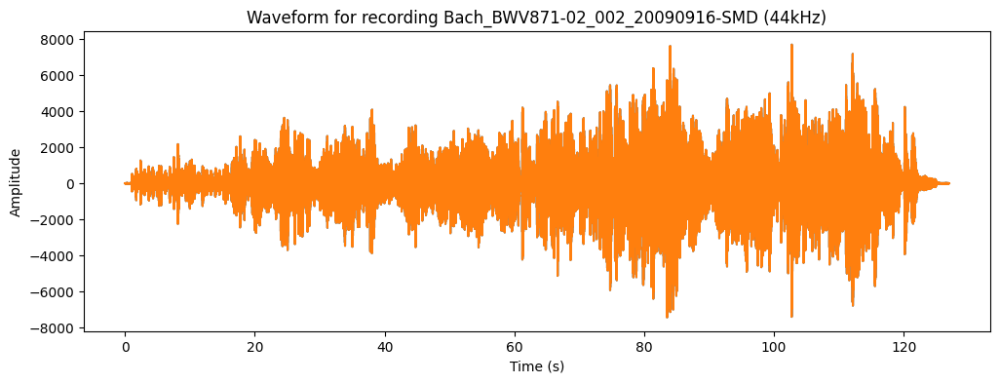

In [5]:
# Visualize the waveform if audio is available
if recording.audio_44 is not None:
    fig = recording.visualize_waveform('44')
    plt.show()
elif recording.audio_22 is not None:
    fig = recording.visualize_waveform('22')
    plt.show()
else:
    print("No audio data available for visualization")

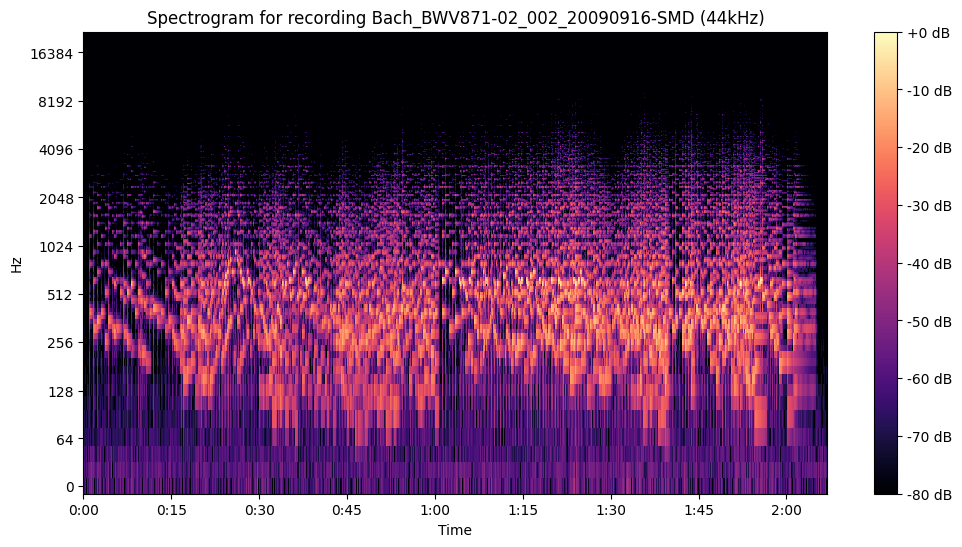

In [6]:
# Visualize the spectrogram if audio is available
if recording.audio_44 is not None:
    fig = recording.visualize_spectrogram('44')
    plt.show()
elif recording.audio_22 is not None:
    fig = recording.visualize_spectrogram('22')
    plt.show()
else:
    print("No audio data available for visualization")

In [7]:
# Play the audio if available
if recording.audio_44 is not None:
    print("Playing 44kHz audio:")
    audio_player = recording.play_audio('44')
    display(audio_player)
elif recording.audio_22 is not None:
    print("Playing 22kHz audio:")
    audio_player = recording.play_audio('22')
    display(audio_player)
else:
    print("No audio data available for playback")

Playing 44kHz audio:


In [8]:
# Play a 10-second segment starting at 30 seconds
if recording.audio_44 is not None:
    print("Playing 10-second segment starting at 30 seconds (44kHz):")
    audio_segment = recording.play_audio('44', start_time=30, duration=10)
    display(audio_segment)
elif recording.audio_22 is not None:
    print("Playing 10-second segment starting at 30 seconds (22kHz):")
    audio_segment = recording.play_audio('22', start_time=30, duration=10)
    display(audio_segment)
else:
    print("No audio data available for playback")

Playing 10-second segment starting at 30 seconds (44kHz):


/Users/jacobbieschke/mess-ai/music_dataset_utils.py:136: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(piano_roll, x_axis='time', y_axis='cqt_note',


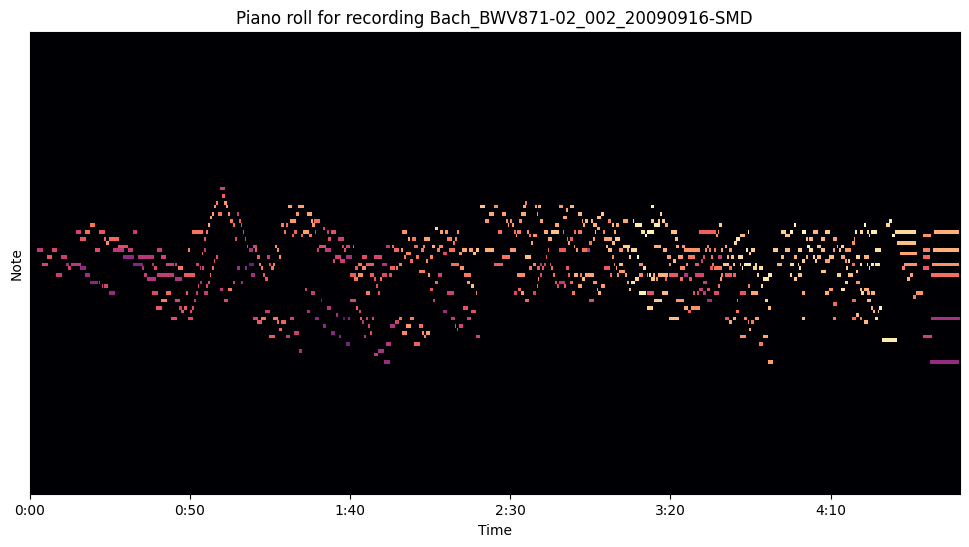

In [9]:
# Visualize the piano roll if MIDI data is available
if recording.midi_data is not None:
    fig = recording.visualize_piano_roll()
    plt.show()
else:
    print("No MIDI data available for visualization")

First 10 note events:


,onset,offset,duration,pitch,velocity,instrument
0,1.027083,1.805208,0.778125,67,41,0
1,1.710417,2.426042,0.715625,63,46,0
2,2.345833,3.006250,0.660417,65,50,0
3,2.975000,3.679167,0.704167,67,46,0
4,3.611458,4.367708,0.756250,60,43,0
5,4.267708,4.972917,0.705208,65,43,0
6,4.888542,5.252083,0.363542,63,36,0
7,5.182292,5.603125,0.420833,62,44,0
8,5.536458,6.888542,1.352083,63,41,0
9,6.180208,6.901042,0.720833,72,45,0



Total notes: 658
Pitch range: 36 to 84


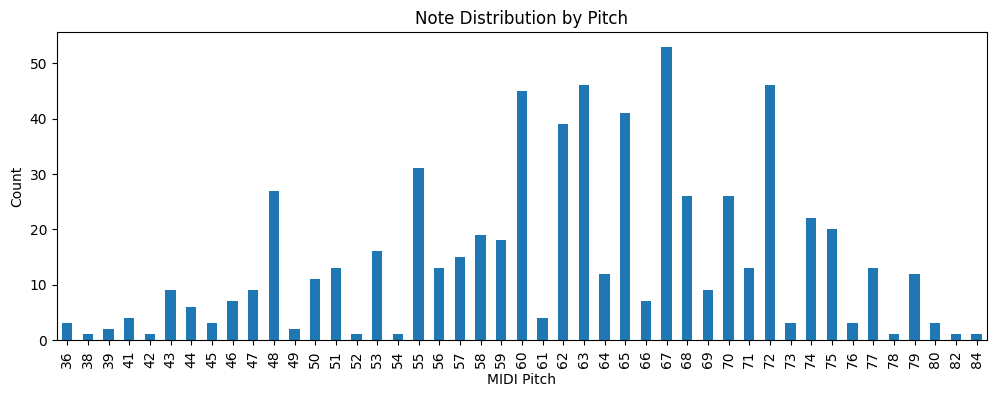

In [10]:
# Extract note events if MIDI data is available
if recording.midi_data is not None:
    notes = recording.get_note_events()
    
    # Display the first few notes
    print("First 10 note events:")
    display(notes.head(10))
    
    # Count notes by pitch
    pitch_counts = notes['pitch'].value_counts().sort_index()
    print(f"\nTotal notes: {len(notes)}")
    print(f"Pitch range: {notes['pitch'].min()} to {notes['pitch'].max()}")
    
    # Plot pitch distribution
    plt.figure(figsize=(12, 4))
    pitch_counts.plot(kind='bar')
    plt.title('Note Distribution by Pitch')
    plt.xlabel('MIDI Pitch')
    plt.ylabel('Count')
    plt.show()
else:
    print("No MIDI data available")

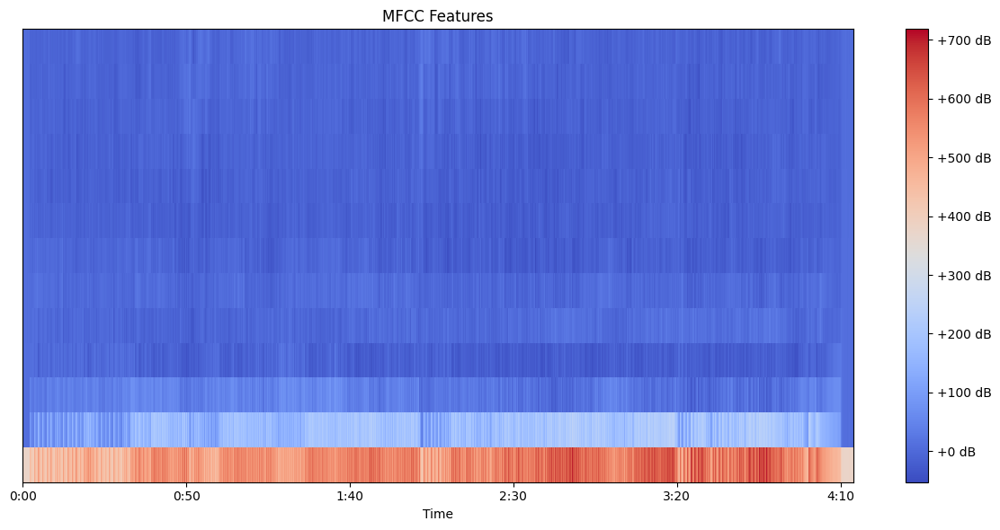

MFCC shape: (13, 10939)


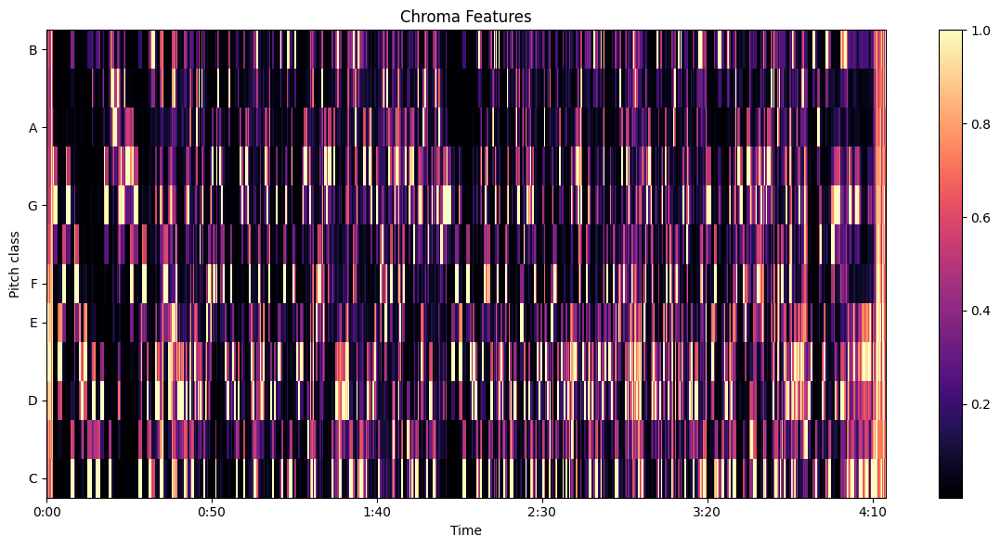

Chroma shape: (12, 10939)


In [11]:
# Import librosa for visualization
import librosa.display

# Extract audio features if audio is available
if recording.audio_44 is not None:
    # Extract MFCCs
    mfccs = recording.extract_features('44', feature_type='mfcc', n_mfcc=13)
    
    # Plot the MFCCs
    plt.figure(figsize=(12, 6))
    librosa.display.specshow(mfccs, x_axis='time')
    plt.colorbar(format='%+2.0f dB')
    plt.title('MFCC Features')
    plt.tight_layout()
    plt.show()
    
    print(f"MFCC shape: {mfccs.shape}")
    
    # Extract chroma features
    chroma = recording.extract_features('44', feature_type='chroma')
    
    # Plot the chroma features
    plt.figure(figsize=(12, 6))
    librosa.display.specshow(chroma, y_axis='chroma', x_axis='time')
    plt.colorbar()
    plt.title('Chroma Features')
    plt.tight_layout()
    plt.show()
    
    print(f"Chroma shape: {chroma.shape}")
elif recording.audio_22 is not None:
    # Extract MFCCs
    mfccs = recording.extract_features('22', feature_type='mfcc', n_mfcc=13)
    
    # Plot the MFCCs
    plt.figure(figsize=(12, 6))
    librosa.display.specshow(mfccs, x_axis='time')
    plt.colorbar(format='%+2.0f dB')
    plt.title('MFCC Features')
    plt.tight_layout()
    plt.show()
    
    print(f"MFCC shape: {mfccs.shape}")
else:
    print("No audio data available for feature extraction")

In [12]:
# Create an interactive audio player with controls
import ipywidgets as widgets
from IPython.display import display, clear_output

# Create dropdown for selecting Bach recordings
recording_dropdown = widgets.Dropdown(
    options=bach_recordings,  # First 5 Bach recordings
    description='Recording:',
    disabled=False,
)

# Create radio buttons for selecting sample rate
sample_rate_radio = widgets.RadioButtons(
    options=['44kHz', '22kHz'],
    value='44kHz',
    description='Sample Rate:',
    disabled=False
)

# Create sliders for start time and duration
start_slider = widgets.FloatSlider(
    value=0,
    min=0,
    max=300,  # Assuming max 5 minutes
    step=1.0,
    description='Start (s):',
    disabled=False,
    continuous_update=False,
)

duration_slider = widgets.FloatSlider(
    value=10,
    min=1,
    max=60,
    step=1.0,
    description='Duration (s):',
    disabled=False,
    continuous_update=False,
)

# Create play button
play_button = widgets.Button(
    description='Play',
    disabled=False,
    button_style='success',
    tooltip='Play audio',
    icon='play'
)

# Create output area
output = widgets.Output()

# Define play button callback
def on_play_button_clicked(b):
    with output:
        clear_output()
        
        # Get selected recording
        recording_id = recording_dropdown.value
        sample_rate = '44' if sample_rate_radio.value == '44kHz' else '22'
        start_time = start_slider.value
        duration = duration_slider.value
        
        print(f"Playing {recording_id} ({sample_rate}kHz) from {start_time:.1f}s for {duration:.1f}s")
        
        # Load and play the recording
        rec = smd.get_recording(recording_id)
        rec.load_audio()
        
        try:
            player = rec.play_audio(sample_rate, start_time, duration)
            display(player)
        except Exception as e:
            print(f"Error playing audio: {e}")

# Connect the callback to the button
play_button.on_click(on_play_button_clicked)

# Create the UI layout
controls = widgets.VBox([
    widgets.HTML("<h3>Interactive Audio Player</h3>"),
    recording_dropdown,
    sample_rate_radio,
    start_slider,
    duration_slider,
    play_button,
    output
])

# Display the controls
display(controls)